# <p style="text-align:center"> Facility Location based on Demand Forecasting of Supply Chain Data </p>

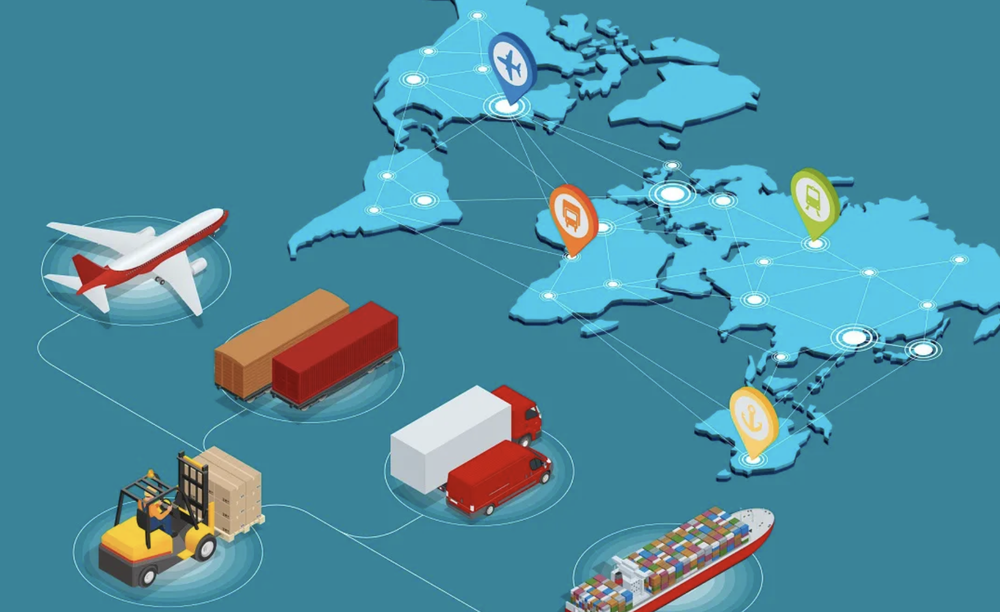

# Project Description / Background: 
Supply chain analytics provides companies with data-driven knowledge, lowering the total cost of service and raising service levels. In order to find patterns and develop insights prediction is frequently regarded as the driving factor in supply chain management (SCM) planning and decision-making processes. Geographical characteristics and shipping methods are the cause of a greater number of deliveries being delivered
late. For many client orders, the distance between the border city and the delivery
city is great, which causes the package to arrive late. Identification of late delivery
patterns can provide a tremendous boost to the company’s overall revenue and
can provide an edge against competitors.

# Dataset Description

Description: This dataset of supply chains, which is owned by the business DataaCo Global, contains information about the company's sold items, financial information (profit, loss, total sales, etc.), shipping information, and customer information, including sales, demographics, and transaction information. The dataset contains approximately 180k transactions from orders placed over a three-year period.


Dataset Link - [Supply Chain Data](https://data.mendeley.com/datasets/8gx2fvg2k6/5)

In [1]:
import pandas as pd

pd.read_csv('./DescriptionDataCoSupplyChain.csv')

,FIELDS,DESCRIPTION
0,Type,: Type of transaction made
1,Days for shipping (real),: Actual shipping days of the purchased product
2,Days for shipment (scheduled),: Days of scheduled delivery of the purchased...
3,Benefit per order,: Earnings per order placed
4,Sales per customer,: Total sales per customer made per customer
5,Delivery Status,: Delivery status of orders: Advance shipping...
6,Late_delivery_risk,: Categorical variable that indicates if send...
7,Category Id,: Product category code
8,Category Name,: Description of the product category
9,Customer City,: City where the customer made the purchase


In [2]:
# List of necessary Libararies

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
import warnings
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn import set_config
set_config(display='diagram')
warnings.filterwarnings("ignore")
plt.rcParams['figure.figsize'] = (16,8)
plt.rcParams.update({'font.size': 13})

In [3]:
# Importing Dataset

data = pd.read_csv('./DataCoSupplyChainDataset.csv', encoding='latin-1')
data.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,02/03/18 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


# Data Cleaning

In [8]:
# Displaying all the columns in our dataset

pd.set_option('display.max_columns', 500)
data.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,20755,1/31/2018 22:56,77202,1360,13.110000,0.04,180517,327.75,0.29,1,327.75,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,02/03/18 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,19492,1/13/2018 12:27,75939,1360,16.389999,0.05,179254,327.75,-0.80,1,327.75,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,19491,1/13/2018 12:06,75938,1360,18.030001,0.06,179253,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,19490,Tate,XXXXXXXXX,Home Office,CA,3200 Amber Bend,90027.0,2,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,19490,1/13/2018 11:45,75937,1360,22.940001,0.07,179252,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Orli,19489,Hendricks,XXXXXXXXX,Corporate,PR,8671 Iron Anchor Corners,725.0,2,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,19489,1/13/2018 11:24,75936,1360,29.500000,0.09,179251,327.75,0.45,1,327.75,298.250000,134.210007,Oceania,Queensland,PENDING_PAYMENT,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [5]:
# Filtering the data only for United States

data['Customer Country'].value_counts()

EE. UU.        111146
Puerto Rico     69373
Name: Customer Country, dtype: int64

In [6]:
# EE. UU. --> United States

supply = data[data['Customer Country']=='EE. UU.']

In [7]:
# Dataset filtered to United States

supply.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,19491,1/13/2018 12:06,75938,1360,18.030001,0.06,179253,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,19490,Tate,XXXXXXXXX,Home Office,CA,3200 Amber Bend,90027.0,2,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,19490,1/13/2018 11:45,75937,1360,22.940001,0.07,179252,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,73,Sporting Goods,Tonawanda,EE. UU.,XXXXXXXXX,Kimberly,19488,Flowers,XXXXXXXXX,Consumer,NY,2122 Hazy Corner,14150.0,2,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,19488,1/13/2018 11:03,75935,1360,32.779999,0.10,179250,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/19/2018 11:03,Standard Class
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,73,Sporting Goods,Miami,EE. UU.,XXXXXXXXX,Erica,19486,Stevens,XXXXXXXXX,Corporate,FL,7595 Cotton Log Row,33162.0,2,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,19486,1/13/2018 10:21,75933,1360,42.610001,0.13,179248,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 10:21,First Class
9,CASH,2,1,132.149994,275.309998,Late delivery,1,73,Sporting Goods,San Ramon,EE. UU.,XXXXXXXXX,Oprah,19484,Delacruz,XXXXXXXXX,Corporate,CA,9139 Blue Blossom Court,94583.0,2,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,19484,1/13/2018 9:39,75931,1360,52.439999,0.16,179246,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 9:39,First Class


In [8]:
# Rows and Columns in dataset

rows, column = supply.shape

print(f'The dataset contains {rows} rows and {column} columns')

The dataset contains 111146 rows and 53 columns


In [9]:
# Dataset Information

supply.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 111146 entries, 2 to 180516
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           111146 non-null  object 
 1   Days for shipping (real)       111146 non-null  int64  
 2   Days for shipment (scheduled)  111146 non-null  int64  
 3   Benefit per order              111146 non-null  float64
 4   Sales per customer             111146 non-null  float64
 5   Delivery Status                111146 non-null  object 
 6   Late_delivery_risk             111146 non-null  int64  
 7   Category Id                    111146 non-null  int64  
 8   Category Name                  111146 non-null  object 
 9   Customer City                  111146 non-null  object 
 10  Customer Country               111146 non-null  object 
 11  Customer Email                 111146 non-null  object 
 12  Customer Fname                

In [10]:
# Dropping insignificant features

supply.drop(columns=['Customer Email','Customer Fname','Customer Id','Category Id',
                     'Customer Lname','Customer Password','Department Id','Order Customer Id',
                     'Order Item Cardprod Id','Order Item Id','Order Zipcode','Product Card Id',
                     'Product Category Id','Product Description','Product Image','Product Status'], inplace=True)

In [11]:
supply.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class
9,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class


In [12]:
# Verifying the datatypes, null, unique and duplicate values

def datainfo(data):
    supply = pd.DataFrame(index=data.columns)
    supply['dtypes'] = data.dtypes
    supply['null_values'] = data.isnull().sum()
    supply['unique_values'] = data.nunique()
    supply['duplicate_values'] = data.duplicated().sum()
    return supply

In [13]:
datainfo(supply)

,dtypes,null_values,unique_values,duplicate_values
Type,object,0,4,0
Days for shipping (real),int64,0,7,0
Days for shipment (scheduled),int64,0,4,0
Benefit per order,float64,0,18648,0
Sales per customer,float64,0,2761,0
Delivery Status,object,0,4,0
Late_delivery_risk,int64,0,2,0
Category Name,object,0,50,0
Customer City,object,0,541,0
Customer Country,object,0,1,0


**Observations: From the above dataframe we can observe that Customer Zipcode contains 3 null values and there are good amount of categorical features in our dataset to build a classification model rather than a regression model**

In [14]:
supply.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class
9,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class


In [15]:
# Dropping missing values

supply.dropna(inplace=True)

In [16]:
supply.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class
9,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class


# Exploratory Data Analysis

## Which Product Category has highest number of sales?

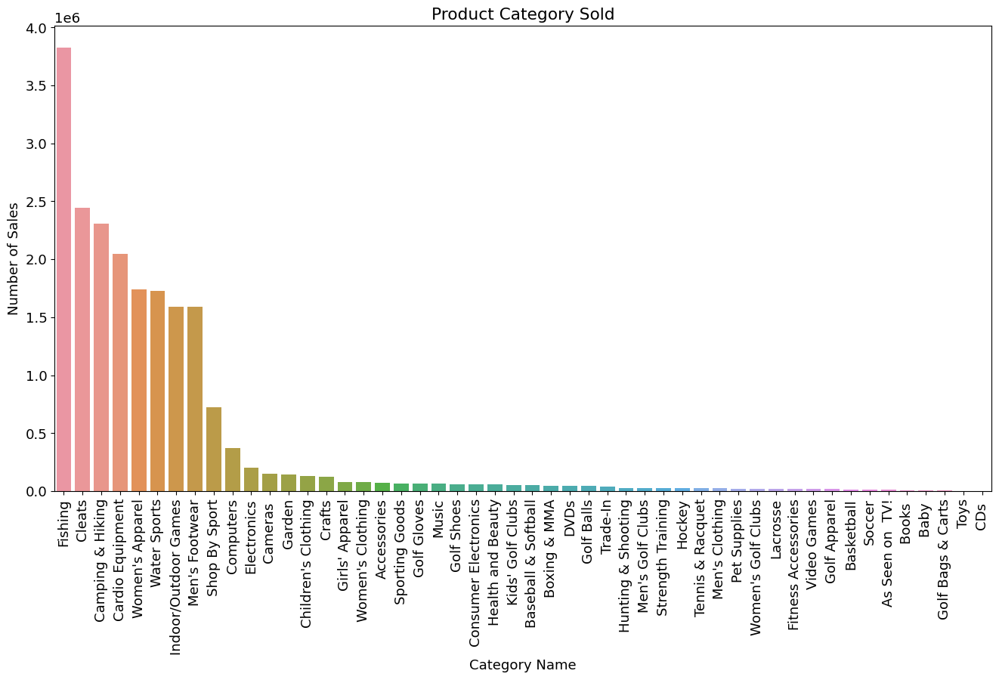

In [17]:
sales = supply.groupby(by='Category Name')['Sales per customer'].sum().reset_index(name='Number of Sales')
sales = sales.sort_values(by='Number of Sales', ascending=False)

sns.barplot(x='Category Name',y='Number of Sales',data=sales,ci=None)
plt.xticks(rotation = 90)
plt.title('Product Category Sold');

**Observation: From the above barplot it is clear that product category such as Fishing and Cleats has highest number of sales, whereas toys and CDs are least sold items**

## What is most common delivery status?

In [18]:
status = supply.groupby(by='Delivery Status')['Order Id'].count().reset_index(name='Number of Orders Placed')

status

,Delivery Status,Number of Orders Placed
0,Advance shipping,25502
1,Late delivery,60985
2,Shipping canceled,4721
3,Shipping on time,19935


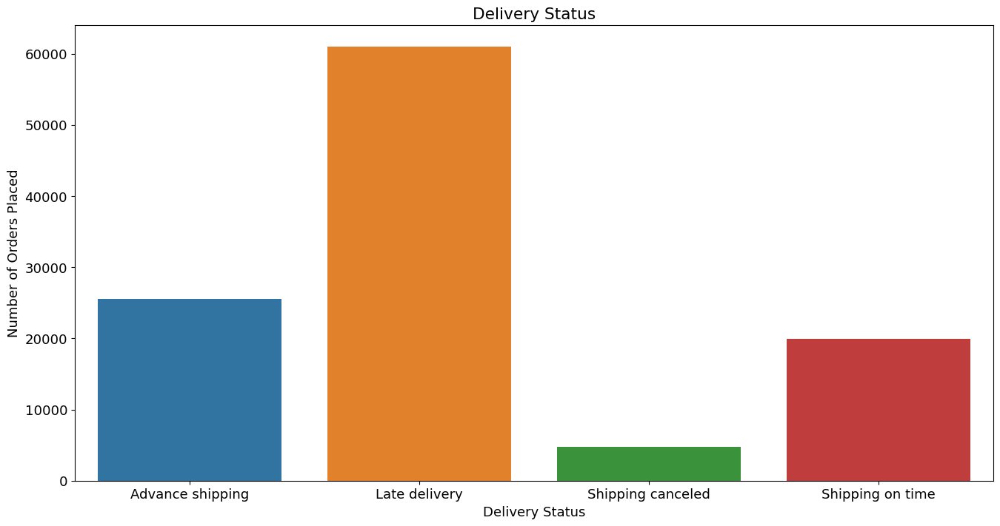

In [19]:
sns.barplot(x='Delivery Status',y='Number of Orders Placed',data=status,)
# plt.xticks(rotation = 90)
plt.title('Delivery Status');

**Observations: It is clear that most of the deliveries of the products are late, however there are some cases where the products have been delivered before the esimated time (Advance shipping)**

## Which Region has highest number of orders and what is the delivery status of each item?

In [20]:
region = supply.groupby(by=['Delivery Status','Order Region'])\
                           ['Order Id'].count().reset_index(name='Number of Orders Placed')

region

,Delivery Status,Order Region,Number of Orders Placed
0,Advance shipping,Canada,176
1,Advance shipping,Caribbean,1199
2,Advance shipping,Central Africa,228
3,Advance shipping,Central America,4082
4,Advance shipping,Central Asia,67
...,...,...,...
87,Shipping on time,US Center,766
88,Shipping on time,West Africa,478
89,Shipping on time,West Asia,646
90,Shipping on time,West of USA,896


In [21]:
barplot_delivery_status = px.bar(data_frame=region, x='Order Region', 
       y='Number of Orders Placed', 
       color='Delivery Status',title='Delivery Status per Region',
       width=1000, height=600)

barplot_delivery_status

**Observation: Above barplot shows that highest numbers of products are coming from *Central America* and *Western Europe* which is kind of obvious as it is closet to North America (Customer Country) with most of them been delivered late, however *Central Asia* and *Canada* got least number of orders**

## What is the order status for every region in the dataset?

In [22]:
delivery = supply.groupby(by=['Order Region','Order Status'])\
['Order Id'].count().reset_index(name='Number of Orders')

delivery.head(8)

,Order Region,Order Status,Number of Orders
0,Canada,CANCELED,16
1,Canada,CLOSED,88
2,Canada,COMPLETE,173
3,Canada,ON_HOLD,14
4,Canada,PENDING,68
5,Canada,PENDING_PAYMENT,100
6,Canada,PROCESSING,66
7,Canada,SUSPECTED_FRAUD,20


In [23]:
order_by_region = px.bar(data_frame=delivery, x='Order Region', 
       y='Number of Orders', 
       color='Order Status',title='Order Status / Region',
       width=1000, height=600)

order_by_region

#### Observation: It can be seen that most of the orders in every region tends to be completed and closed

## Sales in overall Customer Country (Supplier)

In [24]:
customer = supply.groupby(by=['Customer State','Customer City'])\
['Sales per customer'].sum().reset_index(name='Total Sales')

customer.head(8)

,Customer State,Customer City,Total Sales
0,AL,Birmingham,7789.100058
1,AR,Conway,11424.150079
2,AR,Jonesboro,17862.210235
3,AZ,Chandler,40881.380474
4,AZ,Glendale,48514.690575
5,AZ,Mesa,39053.730360
6,AZ,Peoria,19028.640245
7,AZ,Phoenix,166679.991711


In [25]:
customer_map = px.choropleth(data_frame = customer, locations= 'Customer State',locationmode='USA-states',
              color='Total Sales', hover_name='Customer City', 
              color_continuous_scale=px.colors.sequential.Plasma, scope='usa',
              title='Sales per Customer (United States)')

customer_map

In [26]:
order = supply.groupby(by=['Order Country','Order City'])\
['Sales'].sum().reset_index(name='Total Sales')

order.head(8)

,Order Country,Order City,Total Sales
0,Afganistán,Herat,2997.390053
1,Afganistán,Jalalabad,1089.190014
2,Afganistán,Kabul,19882.180337
3,Afganistán,Kandahar,1048.739998
4,Albania,Durres,449.889999
5,Albania,Elbasan,1349.900017
6,Albania,Korce,1199.920029
7,Albania,Shkoder,1249.710014


## Sales in Order Country (Consumer)

In [27]:
order_country_map = px.choropleth(data_frame = order, locationmode='country names', locations= 'Order Country',
              color='Total Sales', hover_name='Order City', 
              color_continuous_scale=px.colors.sequential.Viridis_r,
              title='Sales in Order Country')

order_country_map

## Best Selling Products

In [28]:
product_sales = supply.groupby(by=['Product Name','Delivery Status'])['Sales'].sum().reset_index(name='Total Sales')

top_product_sales = product_sales.sort_values(by='Total Sales', ascending=False).head(15)

top_product_sales

,Product Name,Delivery Status,Total Sales
92,Field & Stream Sportsman 16 Gun Fire Safe,Late delivery,2.319484e+06
272,Perfect Fitness Perfect Rip Deck,Late delivery,1.496871e+06
81,Diamondback Women's Serene Classic Comfort Bi,Late delivery,1.399107e+06
235,Nike Men's Free 5.0+ Running Shoe,Late delivery,1.233477e+06
268,Pelican Sunstream 100 Kayak,Late delivery,1.057747e+06
227,Nike Men's Dri-FIT Victory Golf Polo,Late delivery,1.055350e+06
91,Field & Stream Sportsman 16 Gun Fire Safe,Advance shipping,1.013949e+06
259,O'Brien Men's Neoprene Life Vest,Late delivery,9.714113e+05
215,Nike Men's CJ Elite 2 TD Football Cleat,Late delivery,9.603662e+05
94,Field & Stream Sportsman 16 Gun Fire Safe,Shipping on time,7.487626e+05


In [29]:
top_products = px.bar(data_frame=top_product_sales, x='Product Name', y='Total Sales', 
       color= 'Delivery Status',
       title='Best Selling Products',
       width=1000, height=650)

top_products

**Observation: It can be found that Field & Stream Sportsman 16 Gun Fire Safe, followed by Perfect Fitness Perfect Rip Deck solds the most**

## Expensive Products v/s Cheap Products

In [30]:
price = supply[['Product Name','Product Price']].value_counts().reset_index(name='Count')

price = price.sort_values(by='Product Price',ascending=False).head(15)

In [31]:
cheap = supply[['Product Name','Product Price']].value_counts().reset_index(name='Count')

cheap = cheap.sort_values(['Product Price'],ascending=True).head(15)

In [32]:
fig = make_subplots(subplot_titles=['Top 15 Expensive Products','Top 15 Cheap Products'],
    rows=1, cols=2,
    specs=[[{"type": "bar",}, {"type": "bar"}]])

fig.add_trace(
    go.Bar(x=price['Product Name'],y=price['Product Price'], marker=dict(color="seagreen"), showlegend=False),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=cheap['Product Name'],y=cheap['Product Price'], marker=dict(color="crimson"), showlegend=False),
    row=1, col=2
)

fig.update_layout(height=700, width=980)

fig.show()

**Obseravtions: In the entire dataset is can be seen that SOLE E35 Elliptical and Dell Laptops are the most expensive products, wherein Clicgear 8.0 Shoe Brush and CDs of rock are the cheapest one.**

## What type of transaction is done frequently?

In [33]:
transactions = supply.groupby(by=['Order Region','Type'])['Order Id'].count().reset_index(name='Orders Made')

transactions.head()

,Order Region,Type,Orders Made
0,Canada,CASH,88
1,Canada,DEBIT,187
2,Canada,PAYMENT,100
3,Canada,TRANSFER,170
4,Caribbean,CASH,587


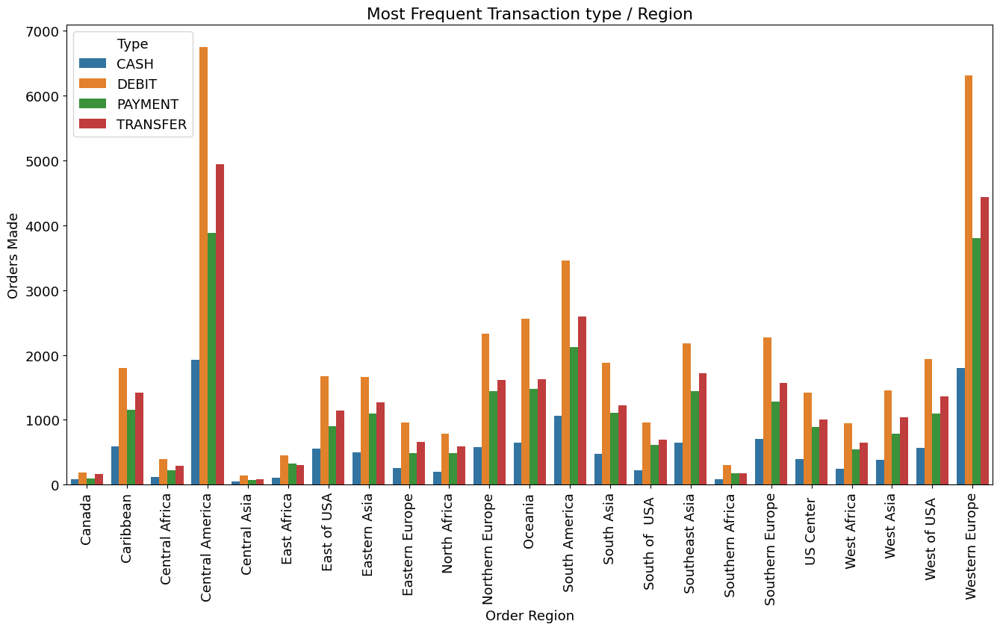

In [34]:
sns.barplot(x='Order Region', y='Orders Made', data=transactions, hue='Type');
plt.xticks(rotation=90)
plt.title('Most Frequent Transaction type / Region');

**Observation: It is found that in each and every region transaction type DEBIT is widely used.**

## Products with Highest Profit and Loss in Sales

In [35]:
profit = supply[supply['Benefit per order']>0]
profit

profit_in_sales = profit.groupby(by='Category Name')['Benefit per order'].sum().reset_index(name='Profit')

profit_in_sales = profit_in_sales.sort_values(by='Profit', ascending=False)

profit_in_sales = profit_in_sales.head(10)

In [36]:
loss_in_sales = supply[supply['Benefit per order']<0]

loss_in_sales = loss_in_sales.groupby(by='Category Name')['Benefit per order'].sum().reset_index(name='Loss')

loss_in_sales['Loss'] = abs(loss_in_sales['Loss'])

loss_in_sales = loss_in_sales.sort_values(by=['Loss'],ascending=False)

loss_in_sales = loss_in_sales.head(10)

In [37]:
fig = make_subplots(subplot_titles=['Top 10 Products with Highest Profit in Sales',
                                    'Top 10 Products with Highest Loss in Sales'],
    rows=1, cols=2,
    specs=[[{"type": "bar",}, {"type": "bar"}]])

fig.add_trace(
    go.Bar(x=profit_in_sales['Category Name'],y=profit_in_sales['Profit'], 
           marker=dict(color="seagreen"), showlegend=False),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=loss_in_sales['Category Name'],y=loss_in_sales['Loss'],
           marker=dict(color="crimson"), showlegend=False),
    row=1, col=2
)

fig.update_layout(height=450, width=950)

fig.show()

**Observation: Apparently it can be observed from the visual that Fishing products are responsible for highest profit and loss, however it is mostly making profit than loss**

## Regions with Highest Profit and Loss in Sales

In [38]:
profit = supply[supply['Benefit per order']>0]

profit_in_sales_region = profit.groupby(by='Order Region')['Benefit per order'].sum().reset_index(name='Profit')

profit_in_sales_region = profit_in_sales_region.sort_values(by='Profit', ascending=False)

profit_in_sales_region = profit_in_sales_region.head(10)

In [39]:
loss_in_sales_region = supply[supply['Benefit per order']<0]


loss_in_sales_region = loss_in_sales_region.groupby(by='Order Region')['Benefit per order'].sum().\
reset_index(name='Loss')

loss_in_sales_region['Loss'] = abs(loss_in_sales['Loss'])

loss_in_sales_region = loss_in_sales_region.sort_values(by=['Loss'],ascending=False)

loss_in_sales_region = loss_in_sales_region.head(10)

In [40]:
fig = make_subplots(subplot_titles=['Top 10 Regions with Highest Profit in Sales',
                                    'Top 10 Regions with Highest Loss in Sales'],
    rows=1, cols=2,
    specs=[[{"type": "bar",}, {"type": "bar"}]])

fig.add_trace(
    go.Bar(x=profit_in_sales_region['Order Region'],y=profit_in_sales_region['Profit'], 
           marker=dict(color="seagreen"), showlegend=False),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=loss_in_sales_region['Order Region'],y=loss_in_sales_region['Loss'],
           marker=dict(color="crimson"), showlegend=False),
    row=1, col=2
)

fig.update_layout(height=450, width=950)

fig.show()

**Observations: It can be observed from the visual that Western Europe makes highest profit followed by Central America, whereas US Center and North Africa is in loss with respect of sales of the product.**

## Detection of Fraudulent Activities

In [41]:
supply['Order Status'].unique()

array(['CLOSED', 'COMPLETE', 'CANCELED', 'PROCESSING', 'PENDING',
       'PENDING_PAYMENT', 'SUSPECTED_FRAUD', 'ON_HOLD', 'PAYMENT_REVIEW'],
      dtype=object)

In [42]:
fraud = supply[supply['Order Status'] == 'SUSPECTED_FRAUD']

activity = fraud['Type'].unique()

print(activity,'\n')

print('It can be clearly seen that most of the suspected frauds happened by means of wire transfer,\
 that means all fraud  activities are happening from more than 1 countries!')

['TRANSFER'] 

It can be clearly seen that most of the suspected frauds happened by means of wire transfer, that means all fraud  activities are happening from more than 1 countries!


In [43]:
#Finding out the Regions where Fraud Activities occurred the most

fraud_region = fraud['Order Region'].value_counts().reset_index(name='Counts')

fraud_region

fraud_region_pie = px.pie(data_frame=fraud_region.head(12), names='index',
       values='Counts', width=900, 
       height=650, title='Highest Frauds / Region')

fraud_region_pie

**Observation: From the above pie chart it is clear that most of the fraudulent activities occured in Western Europe and Central America.** 

### Which State in those two regions ( Western Europe and Central America) has commited highest number of frauds?

In [44]:
fraud_high = fraud[(fraud['Order Region']=='Western Europe') | (fraud['Order Region']=='Central America')]

fraud_high = fraud_high.groupby(by=['Order Region','Order State'])['Order Status'].count().\
reset_index(name='Number of Frauds Commited').sort_values(by='Number of Frauds Commited',ascending=False)

fraud_high = px.bar(data_frame=fraud_high.head(10), x='Order State', y='Number of Frauds Commited', 
       color='Order Region',
       title='Top 10 States with Highest Frauds',
       width=950, height=600)

fraud_high

**Observation: Above barplot signifies that in Western Europe state *Renania del Norte-Westfalia* has commited highest number of frauds, on the other hand in Central America *Managua* is the state which has done highest fradulent transactions.**

### On which products highest frauds are commited?

In [45]:
#Western Europe has highest fraud cases --> Product

fraud_in_product = fraud[fraud['Order Region'] == 'Western Europe']

fraud_in_product = fraud_in_product['Category Name'].value_counts().\
reset_index(name='Product with highest fraud cases')

fraud_in_product.rename(columns={'index':'Category Name'}, inplace=True)

fraud_in_product = px.bar(data_frame=fraud_in_product.head(10), x='Category Name', 
                          y='Product with highest fraud cases', 
                          color='Product with highest fraud cases',
                          title='Highest Suspected Fraud / Product',
                          width=950, height=600)

fraud_in_product

**Observation: It appears that highest fraudulent activities are commited on products such as Men's Footwear & Cleats, however frauds are less for electronic products.**

## Shipping mode with delivery

In [46]:
def delivery(dataframe, shipping_mode):

    ship = dataframe[dataframe['Shipping Mode'] == shipping_mode]

    ship_final = ship['Order Region'].value_counts().\
    reset_index(name='Counts').rename(columns={'index':'Region'})

    return ship_final

In [47]:
standard_class = delivery(supply, 'Standard Class')
same_day = delivery(supply, 'Same Day')
first_class = delivery(supply, 'First Class')
second_class = delivery(supply, 'Second Class')

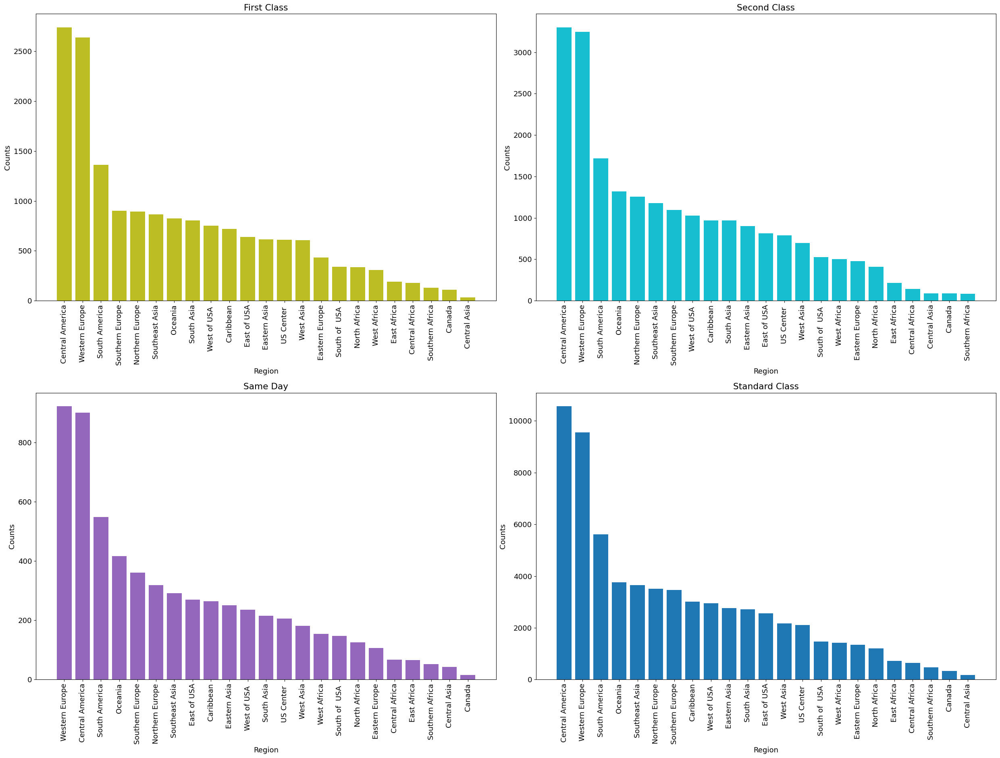

In [48]:
plt.figure(figsize=(25,19))

plt.subplot(2, 2, 1)
plt.title('First Class')
plt.bar(x=first_class['Region'],height=first_class['Counts'], color='tab:olive')
plt.xticks(rotation = 90)
plt.tight_layout()
plt.xlabel('Region')
plt.ylabel('Counts')

plt.subplot(2, 2, 2)
plt.title('Second Class')
plt.bar(x=second_class['Region'],height=second_class['Counts'], color='tab:cyan')
plt.tight_layout()
plt.xticks(rotation = 90)
plt.xlabel('Region')
plt.ylabel('Counts')

plt.subplot(2, 2, 3)
plt.title('Same Day')
plt.bar(x=same_day['Region'],height=same_day['Counts'], color='tab:purple')
plt.xticks(rotation = 90)
plt.tight_layout()
plt.xlabel('Region')
plt.ylabel('Counts')

plt.subplot(2, 2, 4)
plt.title('Standard Class')
plt.bar(x=standard_class['Region'],height=standard_class['Counts'], color='tab:blue')
plt.xticks(rotation = 90)
plt.tight_layout()
plt.xlabel('Region')
plt.ylabel('Counts');

## Map with Delivery Status

In [49]:
geo = supply.groupby(by=['Delivery Status','Latitude','Longitude'])['Order Id'].count().\
reset_index(name='Number of Orders').sort_values(by='Number of Orders', ascending=False)

late_delivery = geo[geo['Delivery Status']=='Late delivery']

advance_shipping = geo[geo['Delivery Status']=='Advance shipping']

shipping_on_time = geo[geo['Delivery Status']=='Shipping on time']

shipping_canceled = geo[geo['Delivery Status']=='Shipping canceled']

In [50]:
late_lon = []
late_lat = []

advance_shipping_lon = []
advance_shipping_lat = []

shipping_on_time_lon = []
shipping_on_time_lat = []

shipping_canceled_lot = []
shipping_canceled_lat = []

for i,j in zip(late_delivery['Longitude'], late_delivery['Latitude']):
    late_lon.append(i)
    late_lat.append(j)
    
for a,b in zip(advance_shipping['Longitude'], advance_shipping['Latitude']):
    advance_shipping_lon.append(a)
    advance_shipping_lat.append(b)
    
for c,d in zip(shipping_on_time['Longitude'], shipping_on_time['Latitude']):
    shipping_on_time_lon.append(c)
    shipping_on_time_lat.append(d)
    
for e,f in zip(shipping_canceled['Longitude'], shipping_canceled['Latitude']):
    shipping_canceled_lot.append(e)
    shipping_canceled_lat.append(f)

In [51]:
#Advance Shipping
fig = go.Figure(go.Scattermapbox(
    mode = "markers",
    opacity=0.8,
    lon = advance_shipping_lon,
    lat = advance_shipping_lat,
    name='Advance Shipping',
    marker = {'size': 10, 'color':'lime'}))

#On time 
fig.add_trace(go.Scattermapbox(
    mode = "markers",
    opacity=0.7,
    lon = shipping_on_time_lon,
    lat = shipping_on_time_lat,
    name='Shipping on time',
    marker = {'size': 10, 'color':'darkviolet'}))

#Late Delivery 
fig.add_trace(go.Scattermapbox(
    mode = "markers",
    opacity=0.7,
    lon = late_lon,
    lat = late_lat,
    name='Late Delivery',
    marker = {'size': 10, 'color':'red'}))

#Cancelled 
fig.add_trace(go.Scattermapbox(
    mode = "markers",
    opacity=0.25,
    lon = shipping_canceled_lot,
    lat = shipping_canceled_lat,
    name='Shipping Canceled',
    marker = {'size': 10, 'color':'yellow'}))

fig.update_layout(
    margin ={'l':0,'t':0,'b':0,'r':0},
    mapbox = {
        'center': {'lon': 10, 'lat': 10},
        'style': "stamen-terrain",
        'center': {'lon': -100, 'lat': 35},
        'zoom': 3}, title=dict(
        text='<b>Title: Status Updates according to Store location</b>',
        x=0.1,
        y=0.1,
        font=dict(
            family="Arial",
            size=15,
            color='black'
        )))


fig.show()

**Observation: Above Map shows the store location and the delivery status of the store in United States (Customer Country)**

## Time Series Analysis

In [52]:
supply['Order Date'] = supply['order date (DateOrders)'].apply(lambda x:x.split(' ')[0])

supply.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode,Order Date
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class,1/13/2018
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class,1/13/2018
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class,1/13/2018
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class,1/13/2018
9,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class,1/13/2018


In [53]:
#Setting the datetime column
supply['Order Date'] = pd.to_datetime(supply['Order Date'])

In [54]:
data = supply.set_index('Order Date')

data.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
Order Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-13,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class
2018-01-13,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class
2018-01-13,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class
2018-01-13,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class
2018-01-13,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class


In [55]:
#Resampling
month = data.resample(rule='M')['Order Id'].count().reset_index(name='Number of Orders')

figure = px.line(month, x="Order Date", 
        y="Number of Orders", 
        title='Order History',
        markers='o',width=1000,
        height=560)

figure

**Observation: The line graph represents the numbers of orders placed with respect to year. After observing the visual carefully it is clear that there was and normal trend of number of orders placed from 2015 to 2017, however after September 2017 the demand from the consumer decreased as can be seen till Jan 2018.**

In [56]:
cross = pd.crosstab(index=data.index.month, 
                    columns=data.index.year,
                    rownames=['Month'],
                    colnames=['Year'])

cross

Year,2015,2016,2017,2018
Month,,,,
1,3315,3418,3181,1316
2,2932,2986,3050,0
3,3300,3252,3253,0
4,3119,3292,3055,0
5,3333,3187,3351,0
6,3050,3056,3013,0
7,3191,3333,3210,0
8,3249,3326,3266,0
9,3220,3146,3091,0


In [57]:
month_names = calendar.month_name[1:]

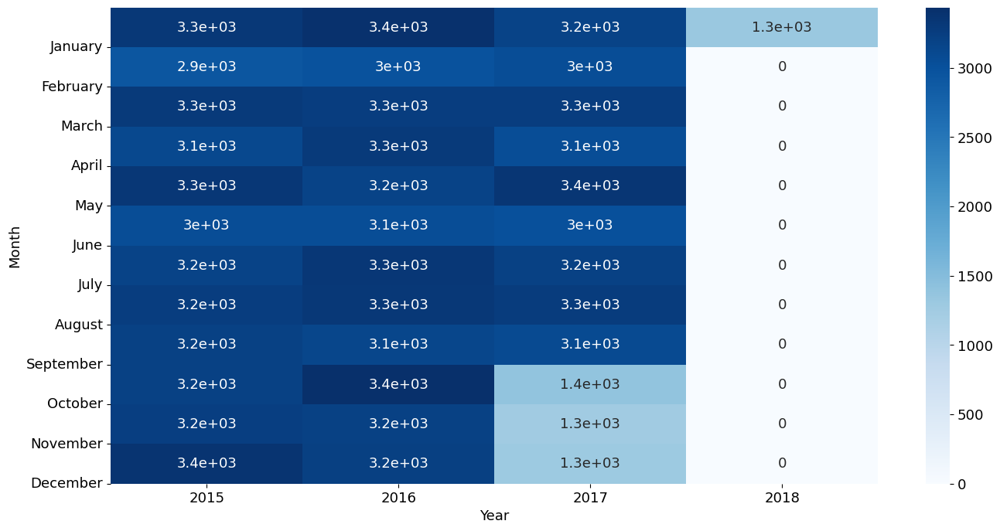

In [58]:
sns.heatmap(cross, cmap='Blues',annot=True,cbar=True)
plt.yticks(np.arange(1,13), labels = month_names, rotation = 0);

## Machine Learning 

- ### Classification & Regression

    - #### Classification --> Delivery Status (Late Delivery Prediction) + Order Status (Complete Order) 
        - #### Classfication Machine Learning models - Logistic Regression, KNN, Random Forest Classifier, Naive Bayes Classifier

# Classification

#### Description: 
- In the era of digital world there are many and many cases where we are curious to know whether the orders receiving from the consumer will be completed or will they make loss to the business. Therefore, we are planning to build a ***Classification model*** based on some features to predict the order which are completed in our supply chain dataset. Currently in our dataset we have a column named ***Order Status*** which has previous transactions recorded. This label can help us to train the dataset based on different status which will immediately flag anonymous activities in future while placing an order to prevent unnecessary order placing and loss.
- Apart from this, we know that customer satisfaction is very essential in terms of order delivery. Late order might depreciate our customer resulting of unsatified service. Hence we will be building a binary classification model for late deliveries to avoid delay of orders in future so the customer gets their required products on time. For this we have previous records of delivery status which can be useful to train a model on delivery system.

# Feature Engineering

In [59]:
supply_chain = supply.copy()

In [60]:
# supply.drop(columns=['shipping date (DateOrders)'])
supply_chain.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode,Order Date
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class,2018-01-13
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class,2018-01-13
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class,2018-01-13
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class,2018-01-13
9,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class,2018-01-13


In [61]:
#We are planing to build a classification model for Order tracking and late deliveries

print(supply_chain['Order Status'].unique())

print('For predicting order complete or incomplete we can elimante the rest of the unique values as they will not make any sense for \
fraud prediction','\n')

print(supply_chain['Delivery Status'].unique())

print('Similarly for predicting late deliveries de we can elimante the rest of the unique values as they \
will not make any sense for prediction')

['CLOSED' 'COMPLETE' 'CANCELED' 'PROCESSING' 'PENDING' 'PENDING_PAYMENT'
 'SUSPECTED_FRAUD' 'ON_HOLD' 'PAYMENT_REVIEW']
For predicting order complete or incomplete we can elimante the rest of the unique values as they will not make any sense for fraud prediction 

['Shipping on time' 'Advance shipping' 'Shipping canceled' 'Late delivery']
Similarly for predicting late deliveries de we can elimante the rest of the unique values as they will not make any sense for prediction


In [62]:
supply_chain['Delivery Status'] = np.where(supply_chain['Delivery Status']=='Late delivery',1,0)

In [63]:
#If obeserved closely we can see column 'Delivery Status' = 'Late Delivery Risk' 
#It is obvious as late delivery and Late Delivery Risk means the same
#Lets drop that column to avoid confusion

#If obeserved closely we can see column 'Order date ' and 'Shipping date' = 'Days for shipping (real)'
#As 'Shipping date' - 'Order date ' = 'Days for shipping (real)'
#Lets drop theses column as well as 'Days for shipping (real)' can handle that

supply_chain.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode,Order Date
2,CASH,4,4,-247.779999,309.720001,0,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class,2018-01-13
3,DEBIT,3,4,22.860001,304.809998,0,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class,2018-01-13
5,TRANSFER,6,4,18.580000,294.980011,0,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class,2018-01-13
7,TRANSFER,2,1,68.430000,285.140015,1,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class,2018-01-13
9,CASH,2,1,132.149994,275.309998,1,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class,2018-01-13


In [64]:
supply_chain.drop(columns=['Late_delivery_risk','order date (DateOrders)',
                           'shipping date (DateOrders)','Order Date'],inplace=True)

In [65]:
supply_chain.dtypes

Type                              object
Days for shipping (real)           int64
Days for shipment (scheduled)      int64
Benefit per order                float64
Sales per customer               float64
Delivery Status                    int64
Category Name                     object
Customer City                     object
Customer Country                  object
Customer Segment                  object
Customer State                    object
Customer Street                   object
Customer Zipcode                 float64
Department Name                   object
Latitude                         float64
Longitude                        float64
Market                            object
Order City                        object
Order Country                     object
Order Id                           int64
Order Item Discount              float64
Order Item Discount Rate         float64
Order Item Product Price         float64
Order Item Profit Ratio          float64
Order Item Quant

In [66]:
le = LabelEncoder()

In [67]:
cath_columns = ['Type','Category Name','Customer City','Customer Country','Customer Segment',
                'Customer State', 'Customer Street', 'Department Name', 'Market', 'Order City',
                'Order Country','Order Region','Order State','Product Name','Shipping Mode',
                'Order Status']

In [68]:
#Label Encoding

for col in range(len(cath_columns)):
    supply_chain[cath_columns[col]] = le.fit_transform(supply_chain[cath_columns[col]])

In [69]:
supply_chain.head(2)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,Shipping Mode
2,0,4,4,-247.779999,309.720001,0,40,436,0,0,3,4647,95125.0,4,37.292233,-121.881279,3,367,68,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,13,814,1,78,327.75,3
3,1,3,4,22.860001,304.809998,0,40,273,0,2,3,1345,90027.0,4,34.125946,-118.291016,3,3061,8,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,11,808,2,78,327.75,3


In [70]:
supply_chain.drop(columns=['Customer Country'], inplace=True)

## Feature Selection

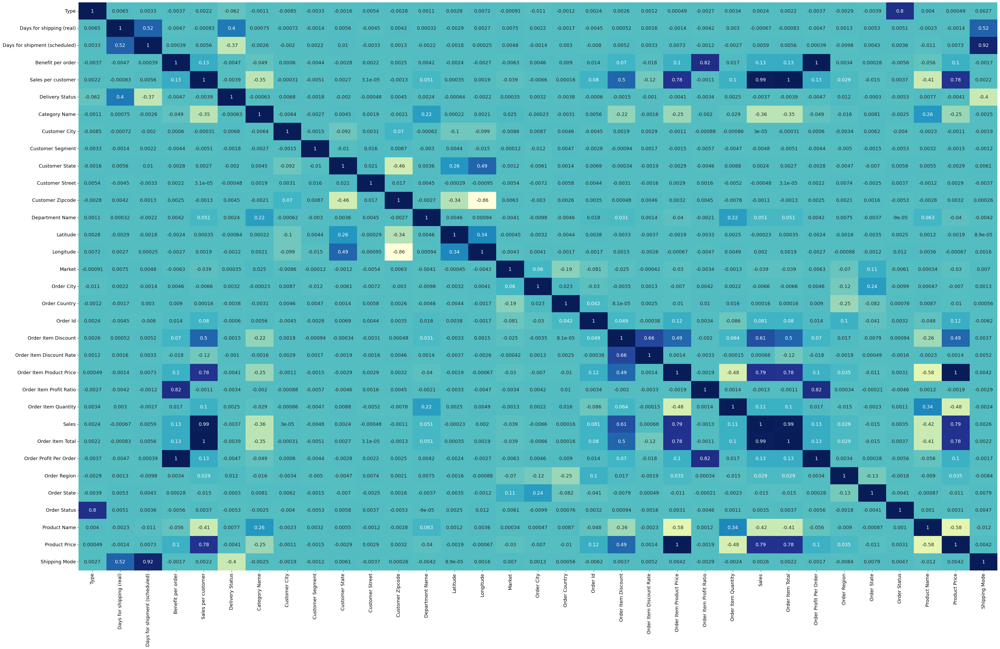

In [71]:
plt.figure(figsize=(45,28))
sns.heatmap(supply_chain.corr(), annot=True, cmap='YlGnBu', cbar=False);

In [72]:
X = supply_chain.drop(columns=['Delivery Status'])
y = supply_chain['Delivery Status']

In [73]:
X.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Category Name,Customer City,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,Shipping Mode
2,0,4,4,-247.779999,309.720001,40,436,0,3,4647,95125.0,4,37.292233,-121.881279,3,367,68,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,13,814,1,78,327.75,3
3,1,3,4,22.860001,304.809998,40,273,2,3,1345,90027.0,4,34.125946,-118.291016,3,3061,8,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,11,808,2,78,327.75,3
5,3,6,4,18.580000,294.980011,40,485,0,29,710,14150.0,4,43.013969,-78.879066,3,3042,8,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,11,808,0,78,327.75,3
7,3,2,1,68.430000,285.140015,40,304,1,8,4111,33162.0,4,25.928869,-80.162872,3,1168,30,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,7,372,7,78,327.75,0
9,0,2,1,132.149994,275.309998,40,440,1,3,5040,94583.0,4,37.773991,-121.966629,3,1168,30,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,7,372,1,78,327.75,0


In [74]:
y.value_counts() #Dataset is kind of balance

1    60985
0    50158
Name: Delivery Status, dtype: int64

In [75]:
from sklearn.feature_selection import SelectKBest, chi2

best_k = SelectKBest(score_func=chi2, k=32)

ranked_features = best_k.fit(abs(X),y)

In [76]:
best_features = pd.DataFrame(ranked_features.scores_,columns=['Score'], index=X.columns).reset_index()
best_features.rename(columns={'index':'Features'},inplace=True)

In [77]:
best_features = best_features.sort_values(by='Score',ascending=False)

In [78]:
X.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Category Name,Customer City,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,Shipping Mode
2,0,4,4,-247.779999,309.720001,40,436,0,3,4647,95125.0,4,37.292233,-121.881279,3,367,68,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,13,814,1,78,327.75,3
3,1,3,4,22.860001,304.809998,40,273,2,3,1345,90027.0,4,34.125946,-118.291016,3,3061,8,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,11,808,2,78,327.75,3
5,3,6,4,18.580000,294.980011,40,485,0,29,710,14150.0,4,43.013969,-78.879066,3,3042,8,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,11,808,0,78,327.75,3
7,3,2,1,68.430000,285.140015,40,304,1,8,4111,33162.0,4,25.928869,-80.162872,3,1168,30,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,7,372,7,78,327.75,0
9,0,2,1,132.149994,275.309998,40,440,1,3,5040,94583.0,4,37.773991,-121.966629,3,1168,30,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,7,372,1,78,327.75,0


In [79]:
best_features

best_features_bar = px.bar(data_frame=best_features, x='Features', y='Score', 
       color='Score',
       title='Best Features',
       width=950, height=600)

best_features_bar

**Observation: As we can see only first few features has highest importance for predicting delivery status. Therefore we will chose the top 15 features in our dataset.**

In [80]:
best_features = best_features.head(15)

col = []

for i in best_features['Features']:
    col.append(i)

drop_columns = []  

for j in X.columns:
    if j not in col:
        drop_columns.append(j)
        
drop_columns

['Benefit per order',
 'Category Name',
 'Customer Segment',
 'Customer State',
 'Customer Street',
 'Department Name',
 'Latitude',
 'Longitude',
 'Market',
 'Order Country',
 'Order Item Discount',
 'Order Item Discount Rate',
 'Order Item Profit Ratio',
 'Order Item Quantity',
 'Order Profit Per Order',
 'Order State',
 'Order Status']

In [81]:
X.drop(drop_columns, axis=1, inplace=True)

In [82]:
X.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Sales per customer,Customer City,Customer Zipcode,Order City,Order Id,Order Item Product Price,Sales,Order Item Total,Order Region,Product Name,Product Price,Shipping Mode
2,0,4,4,309.720001,436,95125.0,367,75938,327.75,327.75,309.720001,13,78,327.75,3
3,1,3,4,304.809998,273,90027.0,3061,75937,327.75,327.75,304.809998,11,78,327.75,3
5,3,6,4,294.980011,485,14150.0,3042,75935,327.75,327.75,294.980011,11,78,327.75,3
7,3,2,1,285.140015,304,33162.0,1168,75933,327.75,327.75,285.140015,7,78,327.75,0
9,0,2,1,275.309998,440,94583.0,1168,75931,327.75,327.75,275.309998,7,78,327.75,0


In [83]:
#Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(88914, 15)
(22229, 15)
(88914,)
(22229,)


## Data Preprocessing

In [84]:
#Pipeline --> One Hot Encoding + Standardization
preprocessing = make_column_transformer((OneHotEncoder(sparse=False),['Type','Days for shipping (real)',
                                                          'Days for shipment (scheduled)','Order Region',
                                                          'Shipping Mode','Customer City']),
                                                           (StandardScaler(),X_train.columns),
                                                           remainder='passthrough')

## Model Training and Testing

In [85]:
#Defining the pipeline to process the automation more easily

def pipeline(preprocessor, model_name, X_training_data, X_testing_data, y_training_data, y_testing_data):
    
    pipe = make_pipeline(preprocessor, model_name)
    
    pipe.fit(X_training_data, y_training_data)
    
    y_pred = pipe.predict(X_testing_data)
    
    cm = confusion_matrix(y_testing_data, y_pred)
    
    print('Model Name:',model_name, '\n')
    
    print('Accuracy:',accuracy_score(y_testing_data, y_pred).round(4), '\n')
    
    print(classification_report(y_testing_data, y_pred), '\n')
    
    print(pd.DataFrame(data=cm,index=['actual: Late delivery','actual: No Late delivery'],
             columns=['predict: Late delivery','predict: No Late delivery']), '\n')

    
    print('\n')

    return pipe
    

In [86]:
#Logistics Regression

lr = LogisticRegression()

logistic_regression = pipeline(preprocessing, lr, X_train, X_test, y_train, y_test)

logistic_regression

In [88]:
#KNeighborsClassifier

from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)

In [89]:
KNN = pipeline(preprocessing, knn, X_train, X_test, y_train, y_test)

KNN

Model Name: KNeighborsClassifier() 

Accuracy: 0.9724 

              precision    recall  f1-score   support

           0       0.98      0.95      0.97     10059
           1       0.96      0.99      0.98     12170

    accuracy                           0.97     22229
   macro avg       0.97      0.97      0.97     22229
weighted avg       0.97      0.97      0.97     22229
 

                          predict: Late delivery  predict: No Late delivery
actual: Late delivery                       9597                        462
actual: No Late delivery                     151                      12019 





Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['Type',
                                                   'Days for shipping (real)',
                                                   'Days for shipment '
                                                   '(scheduled)',
                                                   'Order Region',
                                                   'Shipping Mode',
                                                   'Customer City']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Sales per customer', 'Customer City', 'Customer Zipcode', 'Order City',
       'Order Id', 'Order Item Product Price', 'Sales', 'Order Item Total',
       'Order Region', 'Product Name', 'Product Price', 'Shipping Mode'],
      dtype='object'))])),
                ('kneighborsclassifier', KNeighborsClassifier())])

In [90]:
#Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()

In [91]:
random_forest_classifier = pipeline(preprocessing, rfc, X_train, X_test, y_train, y_test)

random_forest_classifier

Model Name: RandomForestClassifier() 

Accuracy: 0.9844 

              precision    recall  f1-score   support

           0       1.00      0.97      0.98     10059
           1       0.97      1.00      0.99     12170

    accuracy                           0.98     22229
   macro avg       0.99      0.98      0.98     22229
weighted avg       0.98      0.98      0.98     22229
 

                          predict: Late delivery  predict: No Late delivery
actual: Late delivery                       9720                        339
actual: No Late delivery                       7                      12163 





Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['Type',
                                                   'Days for shipping (real)',
                                                   'Days for shipment '
                                                   '(scheduled)',
                                                   'Order Region',
                                                   'Shipping Mode',
                                                   'Customer City']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Sales per customer', 'Customer City', 'Customer Zipcode', 'Order City',
       'Order Id', 'Order Item Product Price', 'Sales', 'Order Item Total',
       'Order Region', 'Product Name', 'Product Price', 'Shipping Mode'],
      dtype='object'))])),
                ('randomforestclassifier', RandomForestClassifier())])

In [92]:
#Naive Bayes Classifier

from sklearn.naive_bayes import GaussianNB

g_nb_classifier = GaussianNB()

In [93]:
Gaussian = pipeline(preprocessing, g_nb_classifier, X_train, X_test, y_train, y_test)

Gaussian

Model Name: GaussianNB() 

Accuracy: 0.7358 

              precision    recall  f1-score   support

           0       0.74      0.64      0.69     10059
           1       0.73      0.81      0.77     12170

    accuracy                           0.74     22229
   macro avg       0.74      0.73      0.73     22229
weighted avg       0.74      0.74      0.73     22229
 

                          predict: Late delivery  predict: No Late delivery
actual: Late delivery                       6479                       3580
actual: No Late delivery                    2294                       9876 





Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['Type',
                                                   'Days for shipping (real)',
                                                   'Days for shipment '
                                                   '(scheduled)',
                                                   'Order Region',
                                                   'Shipping Mode',
                                                   'Customer City']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Sales per customer', 'Customer City', 'Customer Zipcode', 'Order City',
       'Order Id', 'Order Item Product Price', 'Sales', 'Order Item Total',
       'Order Region', 'Product Name', 'Product Price', 'Shipping Mode'],
      dtype='object'))])),
                ('gaussiannb', GaussianNB())])

**From the above 4 classification models, model 3 that is Random Forest Classifier outwieghs all other model. As the accuracy of the model is 98.47% that is highest among all of them and the scores such as precision, recall and f1 is also better than other, therefore we can select Random Forest Classifier as our model to predict late deliveries of the product, however before finalizing we need to cross validate.**

## Cross Validation

In [94]:
from sklearn.model_selection import cross_val_score

In [95]:
def cross_val(model, X, y, cv):
    
    model = model.fit(X, y)
    
    score = abs(cross_val_score(model, X, y, cv=cv, scoring='accuracy')).mean().round(4)
    
    print(f'The mean cross-validated score for {cv}-fold-cross validation is {score*100}%')
    
    return model

In [96]:
cross_val(rfc, X, y, 10)

The mean cross-validated score for 10-fold-cross validation is 97.34%


RandomForestClassifier()

**After cross validating our model we got a very good accuracy of 97.32% which is very close to the actual model we chose (Random Forest Classifier). As the difference between the accuracies of the original model and cross validated model is very minimal, therefore we finalize Random Forest Classifier as our model to predict late deliveries of the product)**

## Classification Type - II

- #### Order Complete or Incomplete Classification

In [97]:
complete = supply.copy()

complete.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,shipping date (DateOrders),Shipping Mode,Order Date
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,Smart watch,327.75,1/17/2018 12:06,Standard Class,2018-01-13
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,Smart watch,327.75,1/16/2018 11:45,Standard Class,2018-01-13
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,1/13/2018 11:03,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,CANCELED,Smart watch,327.75,1/19/2018 11:03,Standard Class,2018-01-13
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,EE. UU.,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,1/13/2018 10:21,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,Smart watch,327.75,1/15/2018 10:21,First Class,2018-01-13
9,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,EE. UU.,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,1/13/2018 9:39,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,CLOSED,Smart watch,327.75,1/15/2018 9:39,First Class,2018-01-13


In [98]:
complete.drop(columns=['order date (DateOrders)', 'Customer Country',
                       'shipping date (DateOrders)','Order Date'],inplace=True)

In [99]:
complete['Order Status'] = np.where(complete['Order Status']=='COMPLETE',1,0)

In [100]:
complete.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,Shipping Mode
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,Consumer,CA,8510 Round Bear Gate,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,0,Smart watch,327.75,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,Home Office,CA,3200 Amber Bend,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,1,Smart watch,327.75,Standard Class
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,Sporting Goods,Tonawanda,Consumer,NY,2122 Hazy Corner,14150.0,Fitness,43.013969,-78.879066,Pacific Asia,Toowoomba,Australia,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,Oceania,Queensland,0,Smart watch,327.75,Standard Class
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,Sporting Goods,Miami,Corporate,FL,7595 Cotton Log Row,33162.0,Fitness,25.928869,-80.162872,Pacific Asia,Guangzhou,China,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,Eastern Asia,Guangdong,0,Smart watch,327.75,First Class
9,CASH,2,1,132.149994,275.309998,Late delivery,1,Sporting Goods,San Ramon,Corporate,CA,9139 Blue Blossom Court,94583.0,Fitness,37.773991,-121.966629,Pacific Asia,Guangzhou,China,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,Eastern Asia,Guangdong,0,Smart watch,327.75,First Class


## Feature Engineering

In [101]:
complete.dtypes

Type                              object
Days for shipping (real)           int64
Days for shipment (scheduled)      int64
Benefit per order                float64
Sales per customer               float64
Delivery Status                   object
Late_delivery_risk                 int64
Category Name                     object
Customer City                     object
Customer Segment                  object
Customer State                    object
Customer Street                   object
Customer Zipcode                 float64
Department Name                   object
Latitude                         float64
Longitude                        float64
Market                            object
Order City                        object
Order Country                     object
Order Id                           int64
Order Item Discount              float64
Order Item Discount Rate         float64
Order Item Product Price         float64
Order Item Profit Ratio          float64
Order Item Quant

In [102]:
cath_columns = ['Type','Category Name','Customer City','Customer Segment',
                'Customer State', 'Customer Street', 'Department Name', 'Market', 'Order City',
                'Order Country','Order Region','Order State','Product Name','Shipping Mode',
                'Delivery Status']

In [103]:
#Label Encoding

for col in range(len(cath_columns)):
    complete[cath_columns[col]] = le.fit_transform(complete[cath_columns[col]])

In [104]:
complete.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Product Name,Product Price,Shipping Mode
2,0,4,4,-247.779999,309.720001,3,0,40,436,0,3,4647,95125.0,4,37.292233,-121.881279,3,367,68,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,13,814,0,78,327.75,3
3,1,3,4,22.860001,304.809998,0,0,40,273,2,3,1345,90027.0,4,34.125946,-118.291016,3,3061,8,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,11,808,1,78,327.75,3
5,3,6,4,18.580000,294.980011,2,0,40,485,0,29,710,14150.0,4,43.013969,-78.879066,3,3042,8,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,11,808,0,78,327.75,3
7,3,2,1,68.430000,285.140015,1,1,40,304,1,8,4111,33162.0,4,25.928869,-80.162872,3,1168,30,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,7,372,0,78,327.75,0
9,0,2,1,132.149994,275.309998,1,1,40,440,1,3,5040,94583.0,4,37.773991,-121.966629,3,1168,30,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,7,372,0,78,327.75,0


## Feature Selection

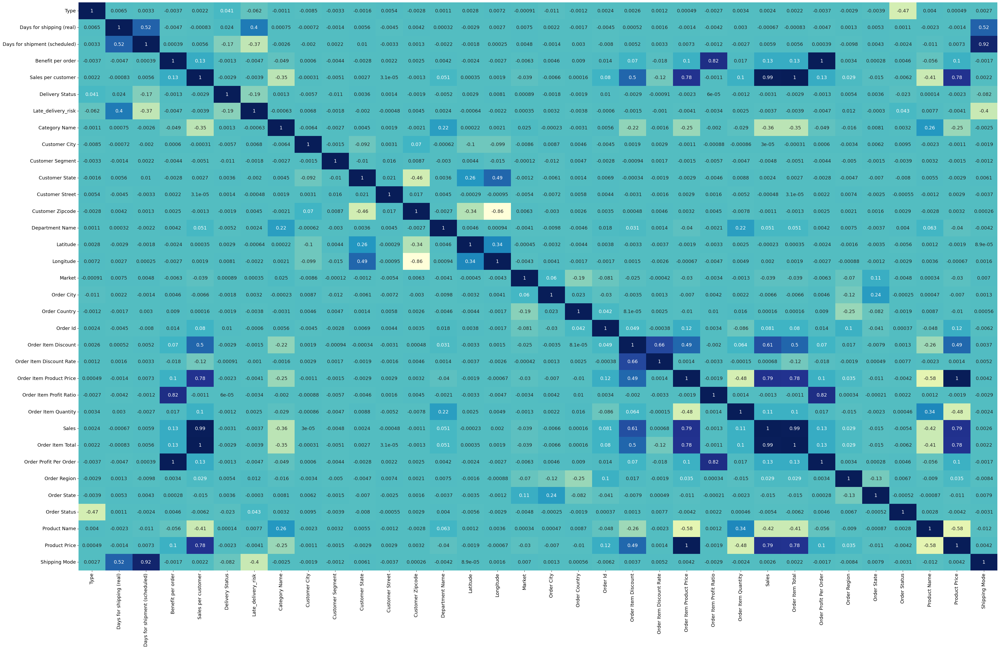

In [105]:
plt.figure(figsize=(45,28))
sns.heatmap(complete.corr(), annot=True, cmap='YlGnBu', cbar=False);

In [106]:
X = complete.drop(columns=['Order Status'])
y = complete['Order Status']

In [107]:
X.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Product Name,Product Price,Shipping Mode
2,0,4,4,-247.779999,309.720001,3,0,40,436,0,3,4647,95125.0,4,37.292233,-121.881279,3,367,68,75938,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,13,814,78,327.75,3
3,1,3,4,22.860001,304.809998,0,0,40,273,2,3,1345,90027.0,4,34.125946,-118.291016,3,3061,8,75937,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,11,808,78,327.75,3
5,3,6,4,18.580000,294.980011,2,0,40,485,0,29,710,14150.0,4,43.013969,-78.879066,3,3042,8,75935,32.779999,0.10,327.75,0.06,1,327.75,294.980011,18.580000,11,808,78,327.75,3
7,3,2,1,68.430000,285.140015,1,1,40,304,1,8,4111,33162.0,4,25.928869,-80.162872,3,1168,30,75933,42.610001,0.13,327.75,0.24,1,327.75,285.140015,68.430000,7,372,78,327.75,0
9,0,2,1,132.149994,275.309998,1,1,40,440,1,3,5040,94583.0,4,37.773991,-121.966629,3,1168,30,75931,52.439999,0.16,327.75,0.48,1,327.75,275.309998,132.149994,7,372,78,327.75,0


In [108]:
y.value_counts(normalize=True) #Dataset is kind of biased and 66% of orders in our 
#dataset are not completed

0    0.669642
1    0.330358
Name: Order Status, dtype: float64

## Feature Selection

In [109]:
from sklearn.feature_selection import SelectKBest, chi2

best_k = SelectKBest(score_func=chi2, k=33)

ranked_features = best_k.fit(abs(X),y)

In [110]:
best_features_order = pd.DataFrame(ranked_features.scores_,columns=['Score'], 
                                   index=X.columns).reset_index()

best_features_order.rename(columns={'index':'Features'},inplace=True)

In [111]:
best_features_order = best_features_order.sort_values(by='Score',ascending=False)

In [112]:
best_features_order

best_features_order_bar = px.bar(data_frame=best_features_order, x='Features', y='Score', 
       color='Score',
       title='Best Features',
       width=950, height=600)

best_features_order_bar

In [113]:
best_features_order = best_features_order.head(14)

col = []

for i in best_features_order['Features']:
    col.append(i)

drop_columns_order = []  

for j in X.columns:
    if j not in col:
        drop_columns_order.append(j)
        
drop_columns_order

['Days for shipping (real)',
 'Days for shipment (scheduled)',
 'Category Name',
 'Customer Segment',
 'Customer Street',
 'Department Name',
 'Latitude',
 'Longitude',
 'Market',
 'Order City',
 'Order Country',
 'Order Item Discount',
 'Order Item Discount Rate',
 'Order Item Profit Ratio',
 'Order Item Quantity',
 'Order Region',
 'Order State',
 'Product Name',
 'Shipping Mode']

In [114]:
X.drop(drop_columns_order, axis=1, inplace=True)

In [115]:
X.head()

,Type,Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Customer City,Customer State,Customer Zipcode,Order Id,Order Item Product Price,Sales,Order Item Total,Order Profit Per Order,Product Price
2,0,-247.779999,309.720001,3,0,436,3,95125.0,75938,327.75,327.75,309.720001,-247.779999,327.75
3,1,22.860001,304.809998,0,0,273,3,90027.0,75937,327.75,327.75,304.809998,22.860001,327.75
5,3,18.580000,294.980011,2,0,485,29,14150.0,75935,327.75,327.75,294.980011,18.580000,327.75
7,3,68.430000,285.140015,1,1,304,8,33162.0,75933,327.75,327.75,285.140015,68.430000,327.75
9,0,132.149994,275.309998,1,1,440,3,94583.0,75931,327.75,327.75,275.309998,132.149994,327.75


In [116]:
#Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, 
                                                    random_state=42, stratify=y) #To handle Imbalance data 

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(88914, 14)
(22229, 14)
(88914,)
(22229,)


## Data Preprocessing

In [117]:
#Pipeline --> One Hot Encoding + Standardization
preprocessing = make_column_transformer((OneHotEncoder(sparse=False),['Type','Delivery Status',
                                                          'Customer City','Customer State']),
                                                           (StandardScaler(),X_train.columns),
                                                           remainder='passthrough')

## Model Training and Testing

In [118]:
#Defining the pipe to automate the whole flow

def pipeline(preprocessor, model_name, X_training_data, X_testing_data, y_training_data, y_testing_data):
    
    pipe = make_pipeline(preprocessor, model_name)
    
    pipe.fit(X_training_data, y_training_data)
    
    y_pred = pipe.predict(X_testing_data)
    
    cm = confusion_matrix(y_testing_data, y_pred)
    
    print('Model Name:',model_name, '\n')
    
    print('Accuracy:',accuracy_score(y_testing_data, y_pred).round(4), '\n')
    
    print(classification_report(y_testing_data, y_pred), '\n')
    
    print(pd.DataFrame(data=cm,index=['actual: Order Complete','actual: Order Incomplete'],
             columns=['predict: Order Complete','predict: Order Incomplete']), '\n')

    
    print('\n')

    return pipe

In [119]:
#Logistic Regression

logistic_regression = pipeline(preprocessing, lr, X_train, X_test, y_train, y_test)

logistic_regression

Model Name: LogisticRegression() 

Accuracy: 0.944 

              precision    recall  f1-score   support

           0       1.00      0.92      0.96     14885
           1       0.86      1.00      0.92      7344

    accuracy                           0.94     22229
   macro avg       0.93      0.96      0.94     22229
weighted avg       0.95      0.94      0.94     22229
 

                          predict: Order Complete  predict: Order Incomplete
actual: Order Complete                      13640                       1245
actual: Order Incomplete                        0                       7344 





Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['Type', 'Delivery Status',
                                                   'Customer City',
                                                   'Customer State']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  Index(['Type', 'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Customer City', 'Customer State',
       'Customer Zipcode', 'Order Id', 'Order Item Product Price', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Product Price'],
      dtype='object'))])),
                ('logisticregression', LogisticRegression())])

In [120]:
#KNeighbourClassifier

KNN = pipeline(preprocessing, knn, X_train, X_test, y_train, y_test)

KNN

Model Name: KNeighborsClassifier() 

Accuracy: 0.9347 

              precision    recall  f1-score   support

           0       0.98      0.92      0.95     14885
           1       0.86      0.96      0.91      7344

    accuracy                           0.93     22229
   macro avg       0.92      0.94      0.93     22229
weighted avg       0.94      0.93      0.94     22229
 

                          predict: Order Complete  predict: Order Incomplete
actual: Order Complete                      13728                       1157
actual: Order Incomplete                      294                       7050 





Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['Type', 'Delivery Status',
                                                   'Customer City',
                                                   'Customer State']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  Index(['Type', 'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Customer City', 'Customer State',
       'Customer Zipcode', 'Order Id', 'Order Item Product Price', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Product Price'],
      dtype='object'))])),
                ('kneighborsclassifier', KNeighborsClassifier())])

In [121]:
#Random Forest Classifier

RFC = pipeline(preprocessing, rfc, X_train, X_test, y_train, y_test)

RFC

Model Name: RandomForestClassifier() 

Accuracy: 0.9462 

              precision    recall  f1-score   support

           0       1.00      0.92      0.96     14885
           1       0.86      0.99      0.92      7344

    accuracy                           0.95     22229
   macro avg       0.93      0.96      0.94     22229
weighted avg       0.95      0.95      0.95     22229
 

                          predict: Order Complete  predict: Order Incomplete
actual: Order Complete                      13730                       1155
actual: Order Incomplete                       42                       7302 





Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['Type', 'Delivery Status',
                                                   'Customer City',
                                                   'Customer State']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  Index(['Type', 'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Customer City', 'Customer State',
       'Customer Zipcode', 'Order Id', 'Order Item Product Price', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Product Price'],
      dtype='object'))])),
                ('randomforestclassifier', RandomForestClassifier())])

In [122]:
#Naive Bayes Classifier

Gaussian = pipeline(preprocessing, g_nb_classifier, X_train, X_test, y_train, y_test)

Gaussian

Model Name: GaussianNB() 

Accuracy: 0.915 

              precision    recall  f1-score   support

           0       0.94      0.93      0.94     14885
           1       0.86      0.89      0.87      7344

    accuracy                           0.92     22229
   macro avg       0.90      0.91      0.90     22229
weighted avg       0.92      0.92      0.92     22229
 

                          predict: Order Complete  predict: Order Incomplete
actual: Order Complete                      13819                       1066
actual: Order Incomplete                      823                       6521 





Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['Type', 'Delivery Status',
                                                   'Customer City',
                                                   'Customer State']),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  Index(['Type', 'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Customer City', 'Customer State',
       'Customer Zipcode', 'Order Id', 'Order Item Product Price', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Product Price'],
      dtype='object'))])),
                ('gaussiannb', GaussianNB())])

**From the above 4 classification models, model 3 that is Random Forest Classifier outwieghs all other model. As the accuracy of the model is 94.65% that is highest among all of them and the scores such as precision, recall and f1 is also better than other, therefore we can select Random Forest Classifier as our model to predict late deliveries of the product, however before finalizing we need to cross validate.**

## Cross Validation

In [123]:
#Cross Validation

cross_val(rfc, X, y, 10)

The mean cross-validated score for 10-fold-cross validation is 91.96%


RandomForestClassifier()

**After cross validating our model we got a very good accuracy of 91.96% which is very close to the actual model we chose (Random Forest Classifier). As the difference between the accuracies of the original model and cross validated model is very minimal, therefore we finalize Random Forest Classifier as our model to predict late deliveries of the product.**

**Accuracies are high for both of the scenerios and are correctly classified by Random Forest Classifier and therefore we can use this model to predict late deliveries and complete orders.**